# Second notebook on blur estimation of dermascopic images

In the first notebook we proved that we can't use simple approach of analyzing variance of laplacian operator over gray version of the dermascopic images of the leisons. In the absolute majority of the images the variance is too low to set any reasonable threshold on which to base the decision.

Therefore lets analyze these images in different color spaces and estimate 'blur index' per each channel (still using variance of the laplacian operator).

In [30]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg
from IPython.display import display_html
from PIL import Image
import gc
import cv2

# list(os.listdir('../input/siim-isic-melanoma-classification'))

In [31]:
# Directory
directory = '../input/siim-isic-melanoma-classification'
IMAGE_PATH = "../input/siim-isic-melanoma-classification/"
img_dir = IMAGE_PATH+'/jpeg/train'

# Import the 2 csv s
train_df = pd.read_csv(directory + '/train.csv')
print(f'There are {train_df.shape[0]} records in the train set')

There are 33126 records in the train set


Split data into benign and malignant leisons subsets. Pick random samples from each for furthere analysis.

In [32]:
benign = train_df[train_df['benign_malignant']=='benign']
malignant = train_df[train_df['benign_malignant']=='malignant']
print(f'There are {benign.shape[0]} records in the benign set, and {malignant.shape[0]} in the malignant dataset')

There are 32542 records in the benign set, and 584 in the malignant dataset


In [33]:
random9_mal = [np.random.choice(malignant['image_name'].values+'.jpg') for i in range(9)]
random9_ben = [np.random.choice(benign['image_name'].values+'.jpg') for i in range(9)]

In [34]:
def variance_of_laplacian(image):
# compute the Laplacian of the image and then return the focus
# measure, which is simply the variance of the Laplacian
    return cv2.Laplacian(image, cv2.CV_64F).var()

def laplacian(image):
# compute the Laplacian of the image and then return the focus
# measure, which is simply the variance of the Laplacian
    res = cv2.Laplacian(image, cv2.CV_64F)
    lap_var = res.var()
    return res, lap_var

In [35]:
# show 9 images with Blur Index in 3*3 grid
def show9(images, l_type):
    print(f'Display {l_type} Images')

    # Adjust the size of your images
    plt.figure(figsize=(10,8))

    # Iterate and plot random images
    for i in range(9):
        plt.subplot(3, 3, i + 1)
        img = plt.imread(os.path.join(img_dir, images[i]))
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        fm = variance_of_laplacian(gray)
        plt.title(f'Bluriness index : {fm:.2f}')
        plt.imshow(img, cmap='gray')
        plt.axis('off')

    # Adjust subplot parameters to give specified padding
    plt.tight_layout()

Lets look at 9 random benign images and estimate their bluriness

Display benign Images


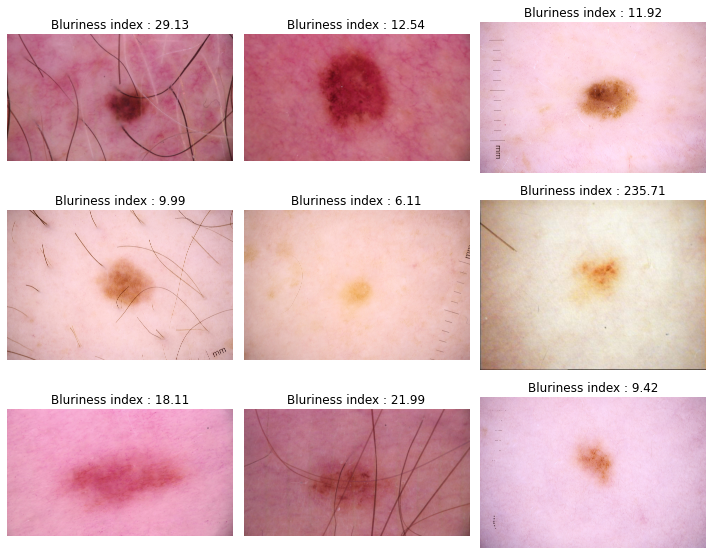

In [36]:
show9(random9_ben, 'benign')

And now lets look at 9 random malignant leisions images and estimate their bluriness

Display malignant Images


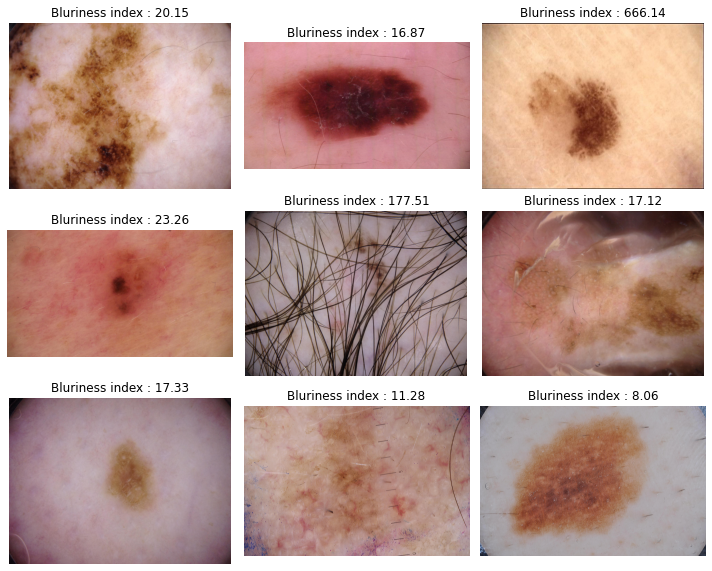

In [37]:
show9(random9_mal, 'malignant')

In [38]:
def show9_RGB(images, l_type):
    print(f'Display {l_type} Images')
    N_subplots = 6
    color = ('b','g','r')

    # Iterate and plot random images
    for i in range(9):
        fig = plt.figure()
        fig.set_figwidth(20)
        fig.set_figheight(3)
        img = plt.imread(os.path.join(img_dir, images[i]))
        ax = fig.add_subplot(1, N_subplots, 1)
        imgplot = plt.imshow(img)
        ax.set_title(f'Size: {img.shape}')
        plt.axis('off')

        for i,col in enumerate(color):
            ax = fig.add_subplot(1, N_subplots, i+2)
            imgplot = plt.imshow(img[:,:,i], cmap='gray')
            ax.set_title(col)
            plt.axis('off')

        color = ('b','g','r')
        ax = fig.add_subplot(1, N_subplots, 5)
        for i,col in enumerate(color):
            histr = cv2.calcHist([img],[i],None,[256],[0,255]) #excluding pure white 255 pixels of the borders in the images
            plt.plot(histr,color = col)
            plt.xlim([0,256])

        ax = fig.add_subplot(1, N_subplots, 6)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        mat, fm = laplacian(gray)
        ax.set_title(f'Bluriness index : {fm:.2f}')
        plt.hist(mat.ravel(), bins=100) 
        plt.show()

And now we'll analyze these images by separate channels and plot the histograms

In [47]:
def show_image_analytics(images, l_type):
    print(f'Display {l_type} Images')
    N_rows = 4
    N_cols = 4
    HSV_color = ('H','S','V')
    BGR_color = ('b','g','r')
    YCrCb_color = ('Y','Cr','Cb')
    plot_color = ('r','g','b')
    pcts = [5, 25, 50, 75, 95]
    blur_idxs = {'r': 0, 'g': 0, 'b': 0, 'H': 0, 'S': 0, 'V': 0, 'Y': 0, 'Cr': 0, 'Cb': 0, 'Gray': 0}


    # Iterate and plot random images
    for n_img in range(len(images)):
        fig = plt.figure()
        fig.set_figwidth(20)
        fig.set_figheight(14)
        img_BGR = cv2.imread(os.path.join(img_dir, images[n_img]))
#         img_BGR = cv2.imread(os.path.join(img_dir, random9_ben[n_img]))
        ax = fig.add_subplot(N_rows, N_cols, 1)
        imgplot = plt.imshow(cv2.cvtColor(img_BGR, cv2.COLOR_BGR2RGB))
        ax.set_title(f'Size: {img_BGR.shape}')
        plt.axis('off')

        ax = fig.add_subplot(N_rows, N_cols, 2)
        gray = cv2.cvtColor(img_BGR, cv2.COLOR_BGR2GRAY)
        mat, blur_idxs['Gray'] = laplacian(gray)
        ax.set_title('Laplacian of gray image')
        plt.hist(mat.ravel(), bins=100) 

        for i,col in enumerate(BGR_color):
            ax = fig.add_subplot(N_rows, N_cols, N_cols + i + 1)
            imgplot = plt.imshow(img_BGR[:,:,i], cmap='gray')
            ax.set_title(col)
            plt.axis('off')
            blur_idxs[col] = variance_of_laplacian(img_BGR[:,:,i])

        ax = fig.add_subplot(N_rows, N_cols, N_cols * 1 + 4)
        ax.set_title(f'Histograms of {BGR_color}')
        for i,col in enumerate(BGR_color):
            histr = cv2.calcHist([img_BGR],[i],None,[256],[0,255]) #excluding pure white 255 pixels of the borders in the images
            plt.plot(histr,color = col, label = BGR_color[i])
            plt.xlim([0,256])
        ax.legend()

        img = cv2.cvtColor(img_BGR, cv2.COLOR_BGR2HSV)
        HSV_pcts = np.percentile(img, pcts)
        for i,col in enumerate(HSV_color):
            ax = fig.add_subplot(N_rows, N_cols, N_cols * 2 + i + 1)
            imgplot = plt.imshow(img[:,:,i], cmap='gray')
            ax.set_title(col)
            plt.axis('off')
            blur_idxs[col] = variance_of_laplacian(img[:,:,i])

        ax = fig.add_subplot(N_rows, N_cols, N_cols * 2 + 4)
        ax.set_title(f'Histograms of {HSV_color}')
        for i,col in enumerate(['pink','gold','indigo']):
    #     for i,col in enumerate(plot_color):
            histr = cv2.calcHist([img],[i],None,[256],[0,255]) #excluding pure white 255 pixels of the borders in the images
            plt.plot(histr,color = col, label = HSV_color[i])
            plt.xlim([0,256])
        ax.legend()

        img = cv2.cvtColor(img_BGR, cv2.COLOR_BGR2YCR_CB)
        YCrCb_pcts = np.percentile(img, pcts)
        for i,col in enumerate(YCrCb_color):
            ax = fig.add_subplot(N_rows, N_cols, N_cols * 3 + i + 1)
            imgplot = plt.imshow(img[:,:,i], cmap='gray')
            ax.set_title(col)
            plt.axis('off')
            blur_idxs[col] = variance_of_laplacian(img[:,:,i])

        ax = fig.add_subplot(N_rows, N_cols, N_cols * 3 + 4)
        ax.set_title(f'Histograms of {YCrCb_color}')
        for i,col in enumerate(['coral', 'olive', 'maroon']):
    #     for i,col in enumerate(plot_color):
            histr = cv2.calcHist([img],[i],None,[256],[0,255]) #excluding pure white 255 pixels of the borders in the images
            plt.plot(histr,color = col, label = YCrCb_color[i])
            plt.xlim([0,256])
        ax.legend()

        plt.show()

        BGR_pcts = np.percentile(img_BGR, pcts)
        print(f'Brightness in RGB space: {dict(zip(pcts,BGR_pcts))}')
        print(f'Brightness in HSV space: {dict(zip(pcts,HSV_pcts))}')
        print(f'Brightness in YCrCb space: {dict(zip(pcts,YCrCb_pcts))}')
        print('Bluriness index: ')
        bis = ''
        for k in blur_idxs:
            bis = bis + k + f': {blur_idxs[k]:.2f}  '
        print(bis)

Display Benign Images


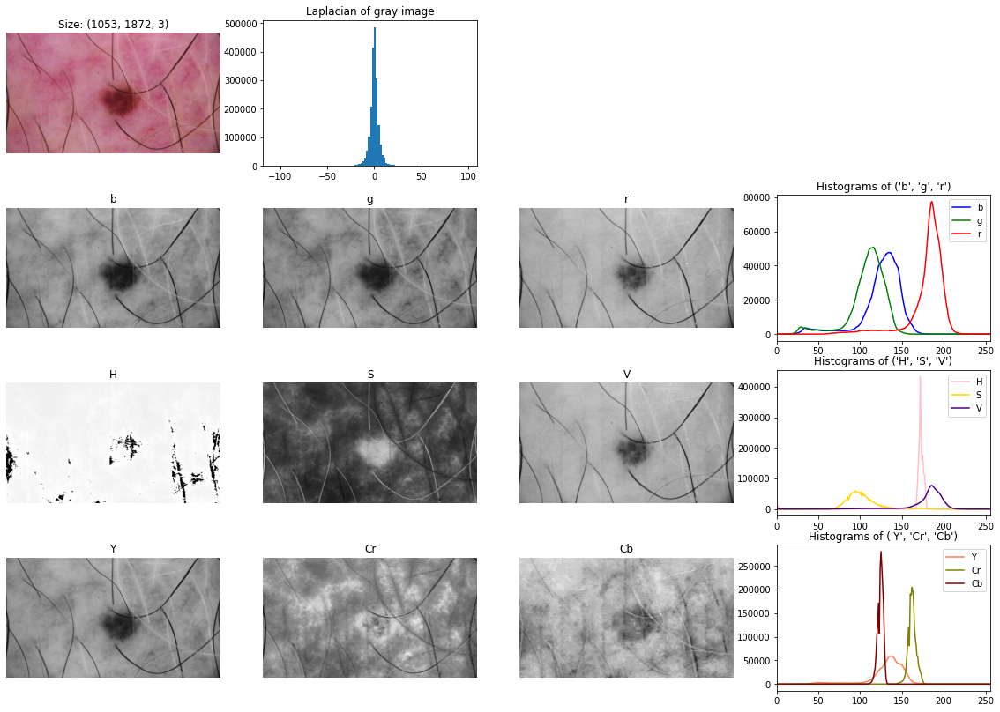

Brightness in RGB space: {5: 79.0, 25: 114.0, 50: 132.0, 75: 177.0, 95: 196.0}
Brightness in HSV space: {5: 84.0, 25: 107.0, 50: 172.0, 75: 178.0, 95: 196.0}
Brightness in YCrCb space: {5: 117.0, 25: 125.0, 50: 136.0, 75: 160.0, 95: 167.0}
Bluriness index: 
r: 30.66  g: 29.46  b: 30.59  H: 995.60  S: 26.51  V: 30.66  Y: 28.52  Cr: 0.91  Cb: 0.63  Gray: 28.52  


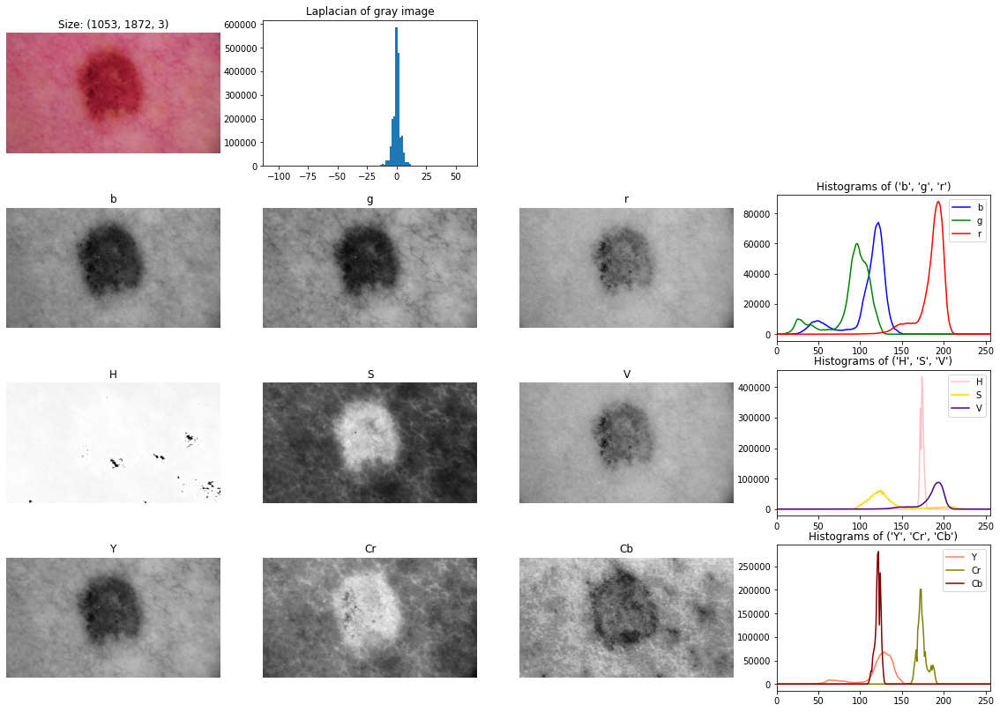

Brightness in RGB space: {5: 46.0, 25: 99.0, 50: 118.0, 75: 182.0, 95: 199.0}
Brightness in HSV space: {5: 111.0, 25: 135.0, 50: 174.0, 75: 186.0, 95: 201.0}
Brightness in YCrCb space: {5: 108.0, 25: 121.0, 50: 127.0, 75: 170.0, 95: 181.0}
Bluriness index: 
r: 13.78  g: 12.91  b: 14.22  H: 228.23  S: 11.86  V: 13.78  Y: 12.09  Cr: 0.73  Cb: 0.64  Gray: 12.09  


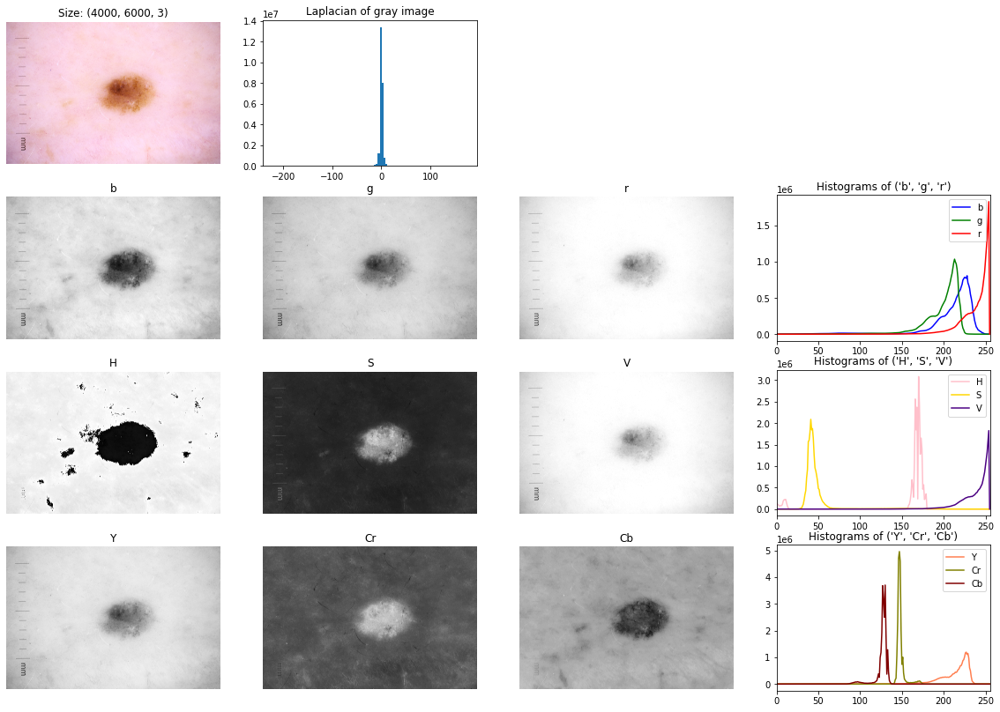

Brightness in RGB space: {5: 170.0, 25: 204.0, 50: 218.0, 75: 236.0, 95: 254.0}
Brightness in HSV space: {5: 36.0, 25: 45.0, 50: 168.0, 75: 234.0, 95: 254.0}
Brightness in YCrCb space: {5: 124.0, 25: 130.0, 50: 147.0, 75: 205.0, 95: 229.0}
Bluriness index: 
r: 12.10  g: 12.32  b: 13.36  H: 355.06  S: 8.77  V: 12.10  Y: 11.43  Cr: 0.76  Cb: 0.57  Gray: 11.43  


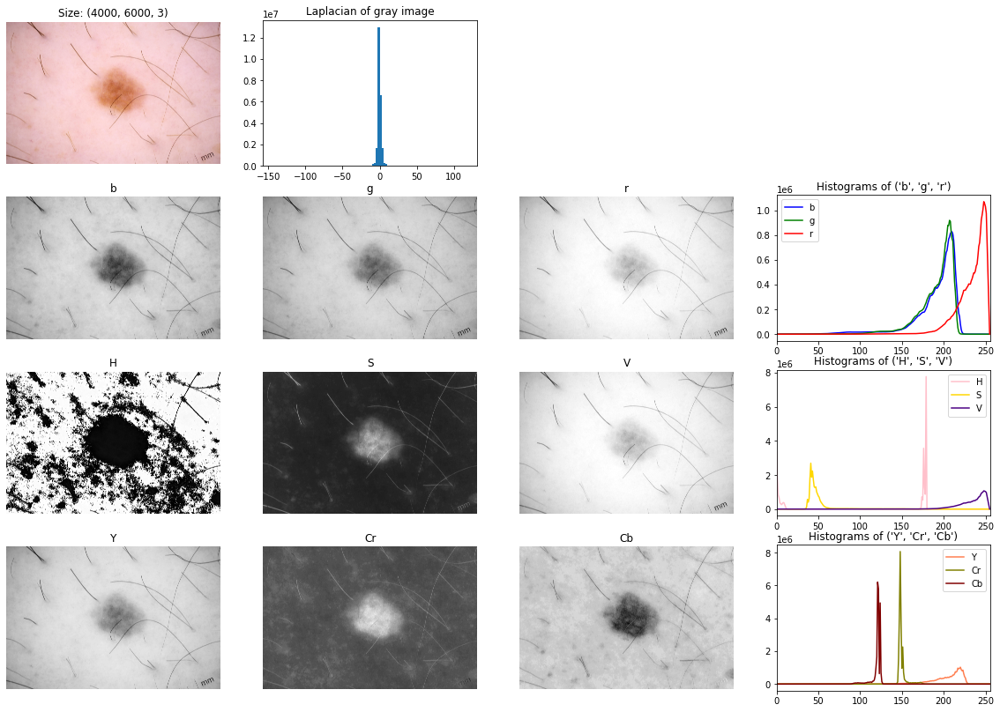

Brightness in RGB space: {5: 157.0, 25: 191.0, 50: 206.0, 75: 226.0, 95: 249.0}
Brightness in HSV space: {5: 1.0, 25: 43.0, 50: 176.0, 75: 226.0, 95: 249.0}
Brightness in YCrCb space: {5: 119.0, 25: 123.0, 50: 148.0, 75: 196.0, 95: 221.0}
Bluriness index: 
r: 10.63  g: 10.23  b: 11.14  H: 3467.56  S: 5.10  V: 10.63  Y: 9.67  Cr: 0.50  Cb: 0.41  Gray: 9.67  


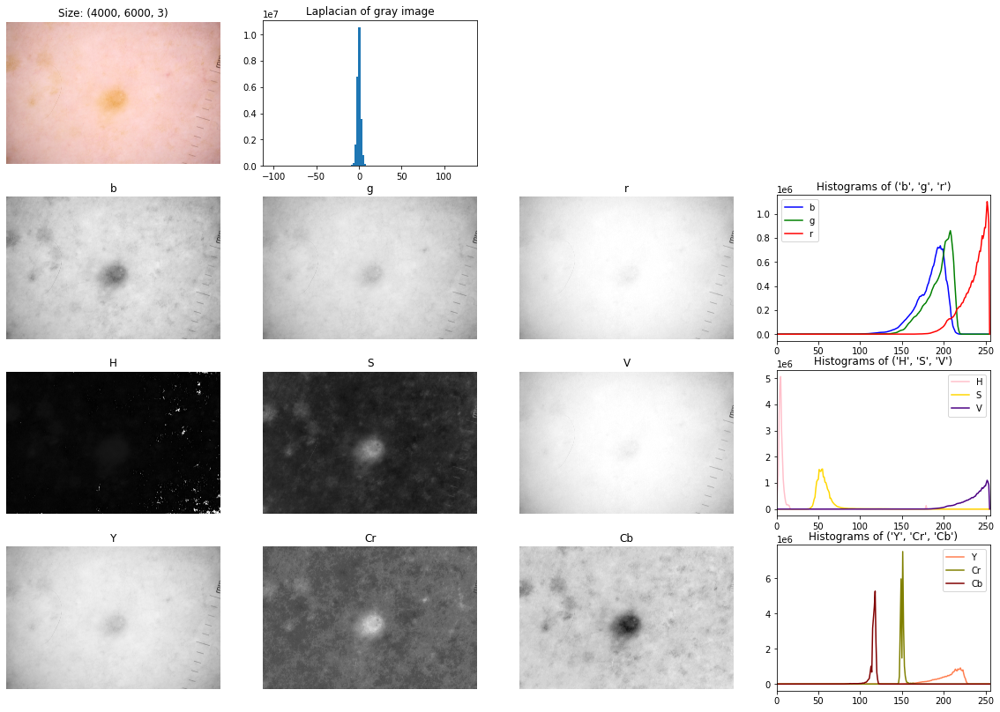

Brightness in RGB space: {5: 161.0, 25: 187.0, 50: 202.0, 75: 228.0, 95: 252.0}
Brightness in HSV space: {5: 3.0, 25: 6.0, 50: 55.0, 75: 228.0, 95: 252.0}
Brightness in YCrCb space: {5: 114.0, 25: 118.0, 50: 151.0, 75: 197.0, 95: 221.0}
Bluriness index: 
r: 6.78  g: 6.34  b: 7.29  H: 355.44  S: 4.18  V: 6.78  Y: 5.83  Cr: 0.47  Cb: 0.45  Gray: 5.83  


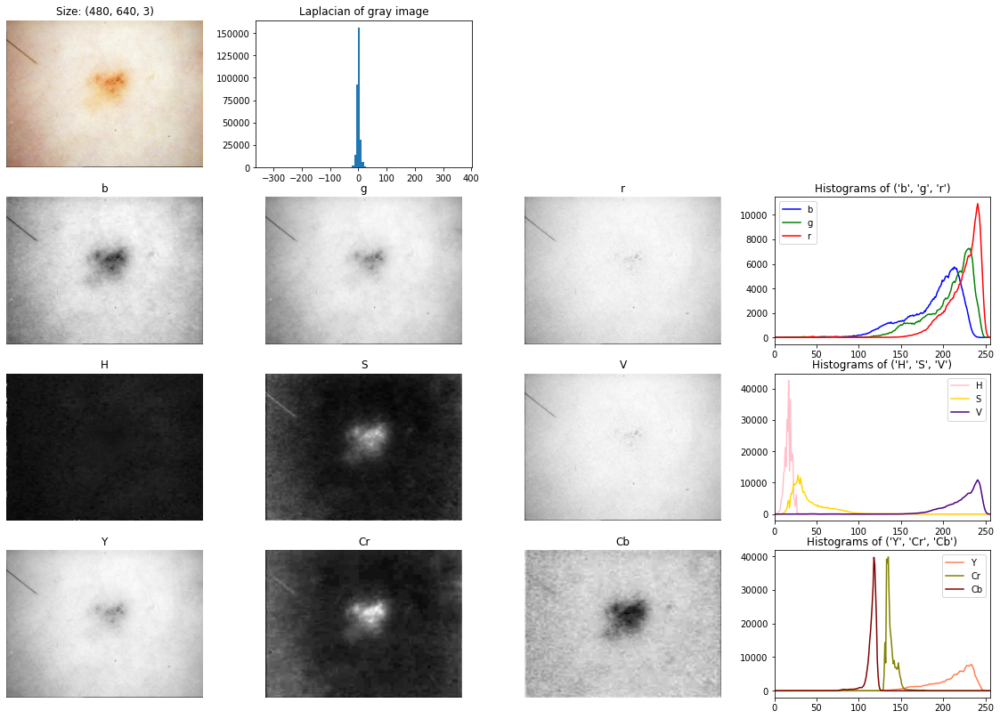

Brightness in RGB space: {5: 143.0, 25: 192.0, 50: 214.0, 75: 230.0, 95: 243.0}
Brightness in HSV space: {5: 12.0, 25: 19.0, 50: 34.0, 75: 214.0, 95: 242.0}
Brightness in YCrCb space: {5: 112.0, 25: 119.0, 50: 136.0, 75: 196.0, 95: 234.0}
Bluriness index: 
r: 240.47  g: 237.21  b: 237.67  H: 110.36  S: 129.70  V: 240.29  Y: 236.17  Cr: 0.93  Cb: 1.81  Gray: 236.17  


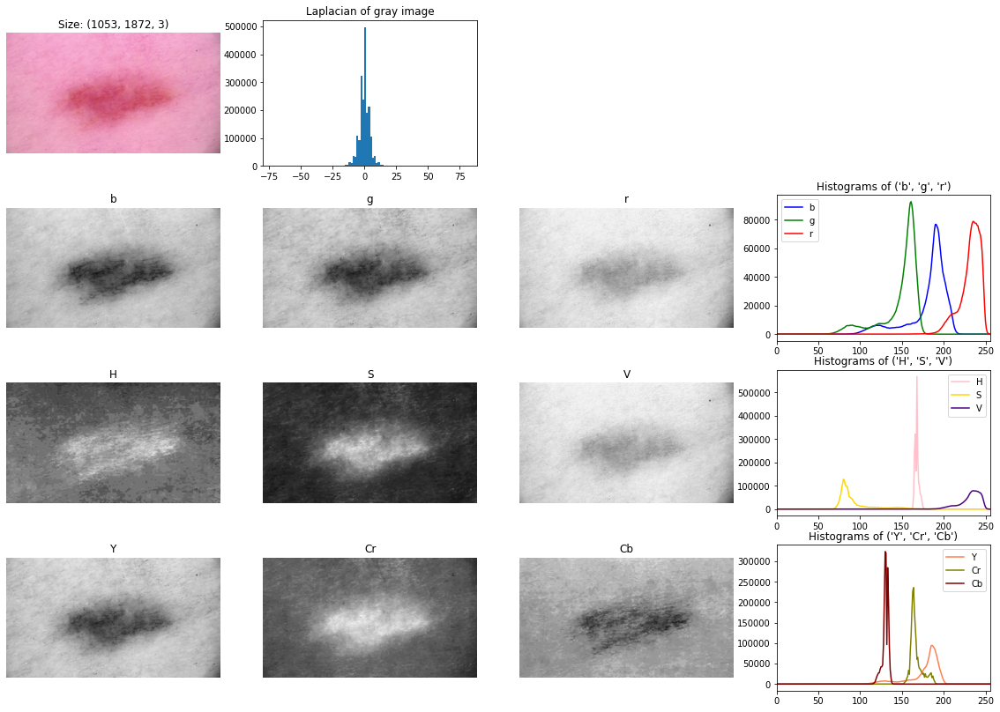

Brightness in RGB space: {5: 117.0, 25: 159.0, 50: 189.0, 75: 226.0, 95: 244.0}
Brightness in HSV space: {5: 78.0, 25: 95.0, 50: 168.0, 75: 226.0, 95: 244.0}
Brightness in YCrCb space: {5: 126.0, 25: 133.0, 50: 163.0, 75: 179.0, 95: 192.0}
Bluriness index: 
r: 19.44  g: 18.51  b: 19.61  H: 0.53  S: 7.96  V: 19.44  Y: 17.67  Cr: 0.78  Cb: 0.59  Gray: 17.67  


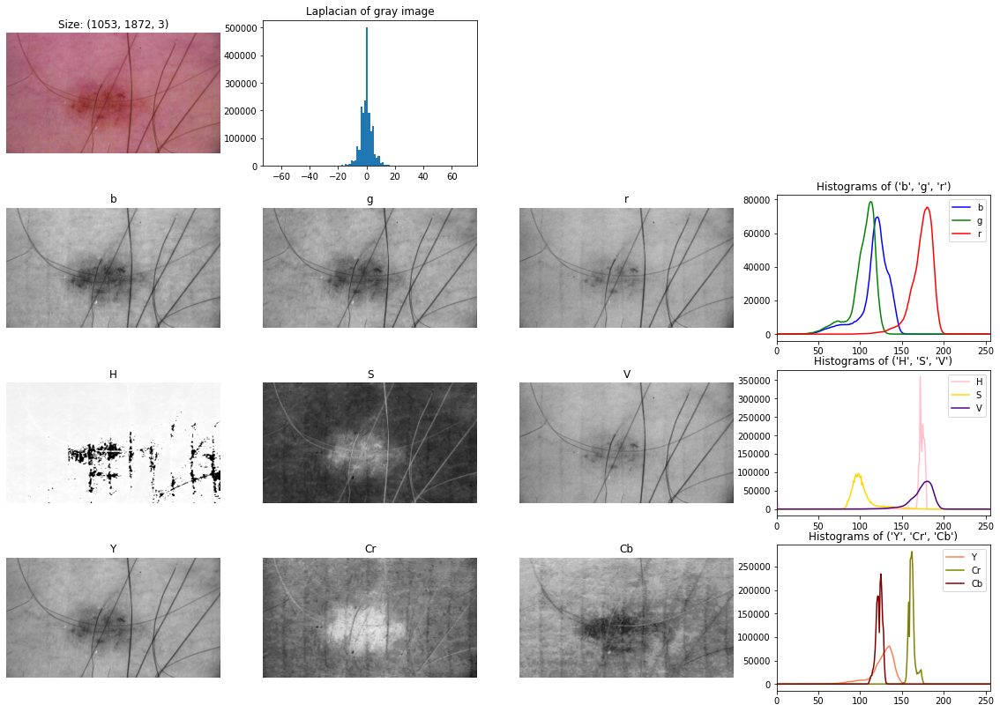

Brightness in RGB space: {5: 79.0, 25: 109.0, 50: 121.0, 75: 168.0, 95: 186.0}
Brightness in HSV space: {5: 90.0, 25: 105.0, 50: 171.0, 75: 176.0, 95: 186.0}
Brightness in YCrCb space: {5: 113.0, 25: 123.0, 50: 130.0, 75: 160.0, 95: 165.0}
Bluriness index: 
r: 23.07  g: 22.32  b: 23.76  H: 1562.67  S: 18.50  V: 23.07  Y: 21.46  Cr: 0.72  Cb: 0.70  Gray: 21.46  


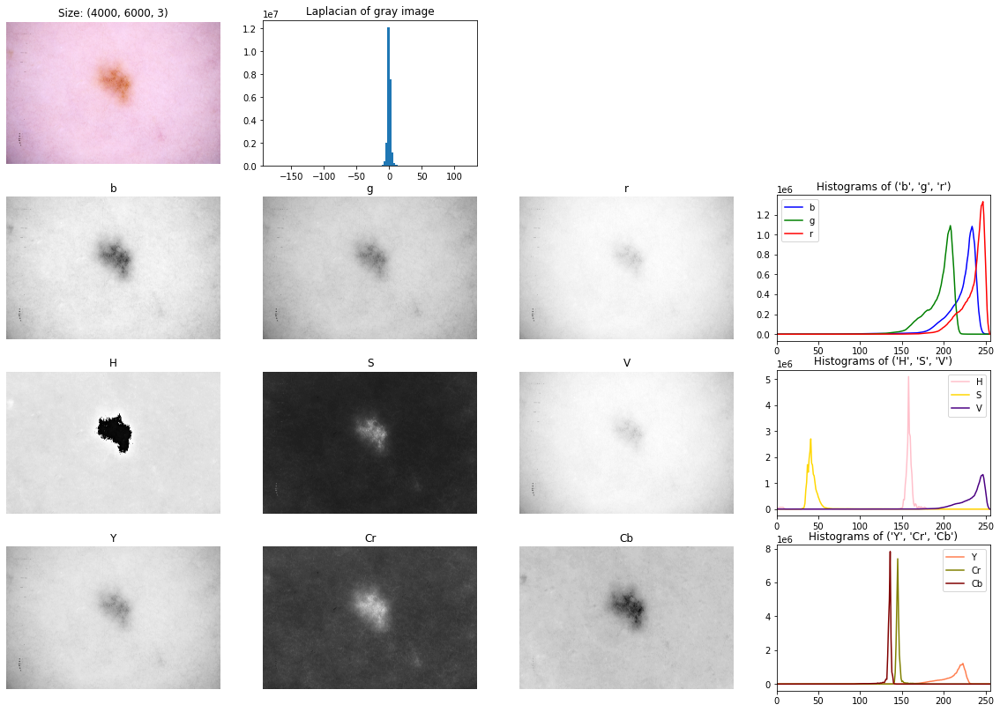

Brightness in RGB space: {5: 174.0, 25: 203.0, 50: 220.0, 75: 237.0, 95: 248.0}
Brightness in HSV space: {5: 37.0, 25: 45.0, 50: 158.0, 75: 228.0, 95: 248.0}
Brightness in YCrCb space: {5: 133.0, 25: 136.0, 50: 145.0, 75: 202.0, 95: 224.0}
Bluriness index: 
r: 10.35  g: 9.78  b: 10.37  H: 86.58  S: 5.12  V: 10.35  Y: 9.14  Cr: 0.58  Cb: 0.37  Gray: 9.14  


In [48]:
show_image_analytics(random9_ben, 'Benign')

In [49]:
# #     print(f'Display {l_type} Images')
# N_rows = 4
# N_cols = 4
# HSV_color = ('H','S','V')
# BGR_color = ('b','g','r')
# YCrCb_color = ('Y','Cr','Cb')
# plot_color = ('r','g','b')
# pcts = [5, 25, 50, 75, 95]
# # pcts = [5,10,25,50,75,90,95]
# blur_idxs = {'r': 0, 'g': 0, 'b': 0, 'H': 0, 'S': 0, 'V': 0, 'Y': 0, 'Cr': 0, 'Cb': 0, 'Gray': 0}


# # Iterate and plot random images
# for n_img in range(1):
#     fig = plt.figure()
#     fig.set_figwidth(20)
#     fig.set_figheight(14)
#     img_BGR = cv2.imread(os.path.join(img_dir, random9_ben[n_img]))
# #     img = cv2.imread(os.path.join(img_dir, images[i]))
#     ax = fig.add_subplot(N_rows, N_cols, 1)
#     imgplot = plt.imshow(cv2.cvtColor(img_BGR, cv2.COLOR_BGR2RGB))
#     ax.set_title(f'Size: {img_BGR.shape}')
#     plt.axis('off')

#     ax = fig.add_subplot(N_rows, N_cols, 2)
#     gray = cv2.cvtColor(img_BGR, cv2.COLOR_BGR2GRAY)
#     mat, blur_idxs['Gray'] = laplacian(gray)
#     ax.set_title('Laplacian of gray image')
#     plt.hist(mat.ravel(), bins=100) 

#     for i,col in enumerate(BGR_color):
#         ax = fig.add_subplot(N_rows, N_cols, N_cols + i + 1)
#         imgplot = plt.imshow(img_BGR[:,:,i], cmap='gray')
#         ax.set_title(col)
#         plt.axis('off')
#         blur_idxs[col] = variance_of_laplacian(img_BGR[:,:,i])

#     ax = fig.add_subplot(N_rows, N_cols, N_cols * 1 + 4)
#     ax.set_title(f'Histograms of {BGR_color}')
#     for i,col in enumerate(BGR_color):
#         histr = cv2.calcHist([img_BGR],[i],None,[256],[0,255]) #excluding pure white 255 pixels of the borders in the images
#         plt.plot(histr,color = col, label = BGR_color[i])
#         plt.xlim([0,256])
#     ax.legend()

#     img = cv2.cvtColor(img_BGR, cv2.COLOR_BGR2HSV)
#     HSV_pcts = np.percentile(img, pcts)
#     for i,col in enumerate(HSV_color):
#         ax = fig.add_subplot(N_rows, N_cols, N_cols * 2 + i + 1)
#         imgplot = plt.imshow(img[:,:,i], cmap='gray')
#         ax.set_title(col)
#         plt.axis('off')
#         blur_idxs[col] = variance_of_laplacian(img[:,:,i])

#     ax = fig.add_subplot(N_rows, N_cols, N_cols * 2 + 4)
#     ax.set_title(f'Histograms of {HSV_color}')
#     for i,col in enumerate(['pink','gold','indigo']):
# #     for i,col in enumerate(plot_color):
#         histr = cv2.calcHist([img],[i],None,[256],[0,255]) #excluding pure white 255 pixels of the borders in the images
#         plt.plot(histr,color = col, label = HSV_color[i])
#         plt.xlim([0,256])
#     ax.legend()

#     img = cv2.cvtColor(img_BGR, cv2.COLOR_BGR2YCR_CB)
#     YCrCb_pcts = np.percentile(img, pcts)
#     for i,col in enumerate(YCrCb_color):
#         ax = fig.add_subplot(N_rows, N_cols, N_cols * 3 + i + 1)
#         imgplot = plt.imshow(img[:,:,i], cmap='gray')
#         ax.set_title(col)
#         plt.axis('off')
#         blur_idxs[col] = variance_of_laplacian(img[:,:,i])

#     ax = fig.add_subplot(N_rows, N_cols, N_cols * 3 + 4)
#     ax.set_title(f'Histograms of {YCrCb_color}')
#     for i,col in enumerate(['coral', 'olive', 'maroon']):
# #     for i,col in enumerate(plot_color):
#         histr = cv2.calcHist([img],[i],None,[256],[0,255]) #excluding pure white 255 pixels of the borders in the images
#         plt.plot(histr,color = col, label = YCrCb_color[i])
#         plt.xlim([0,256])
#     ax.legend()

#     plt.show()

#     BGR_pcts = np.percentile(img_BGR, pcts)
#     print(f'Brightness in RGB space: {dict(zip(pcts,BGR_pcts))}')
#     print(f'Brightness in HSV space: {dict(zip(pcts,HSV_pcts))}')
#     print(f'Brightness in YCrCb space: {dict(zip(pcts,YCrCb_pcts))}')
#     print('Bluriness index: ')
#     bis = ''
#     for k in blur_idxs:
#         bis = bis + k + f': {blur_idxs[k]:.2f}  '
#     print(bis)

Display Malignant Images


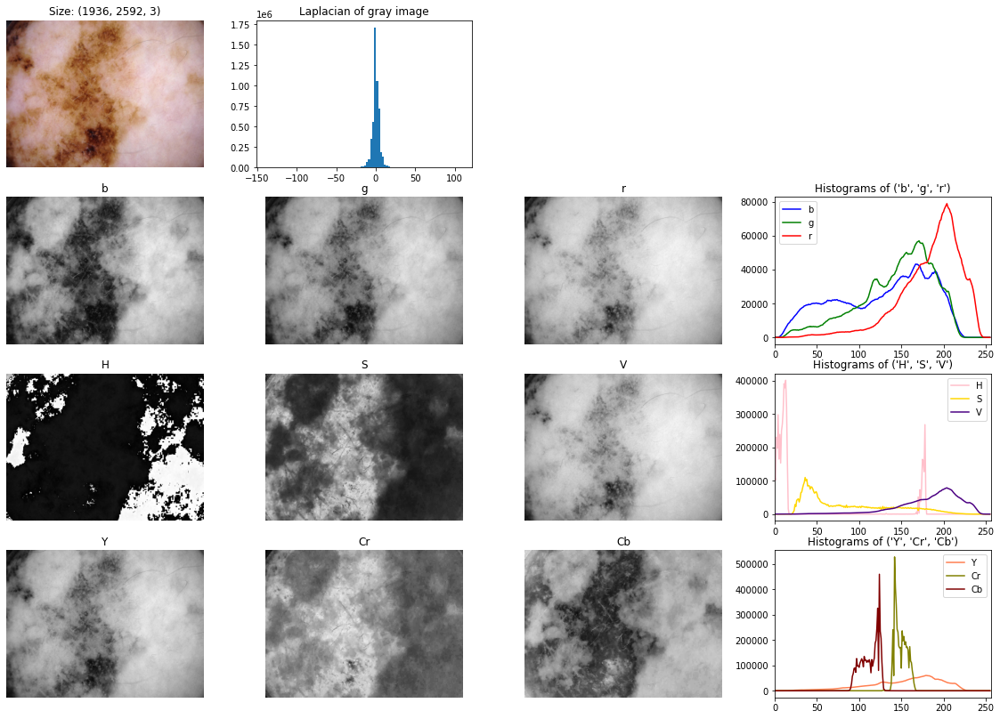

Brightness in RGB space: {5: 48.0, 25: 123.0, 50: 164.0, 75: 192.0, 95: 219.0}
Brightness in HSV space: {5: 4.0, 25: 14.0, 50: 106.0, 75: 178.0, 95: 219.0}
Brightness in YCrCb space: {5: 94.0, 25: 118.0, 50: 142.0, 75: 157.0, 95: 197.0}
Bluriness index: 
r: 20.71  g: 20.33  b: 22.09  H: 1527.29  S: 25.47  V: 20.71  Y: 19.62  Cr: 0.53  Cb: 0.73  Gray: 19.62  


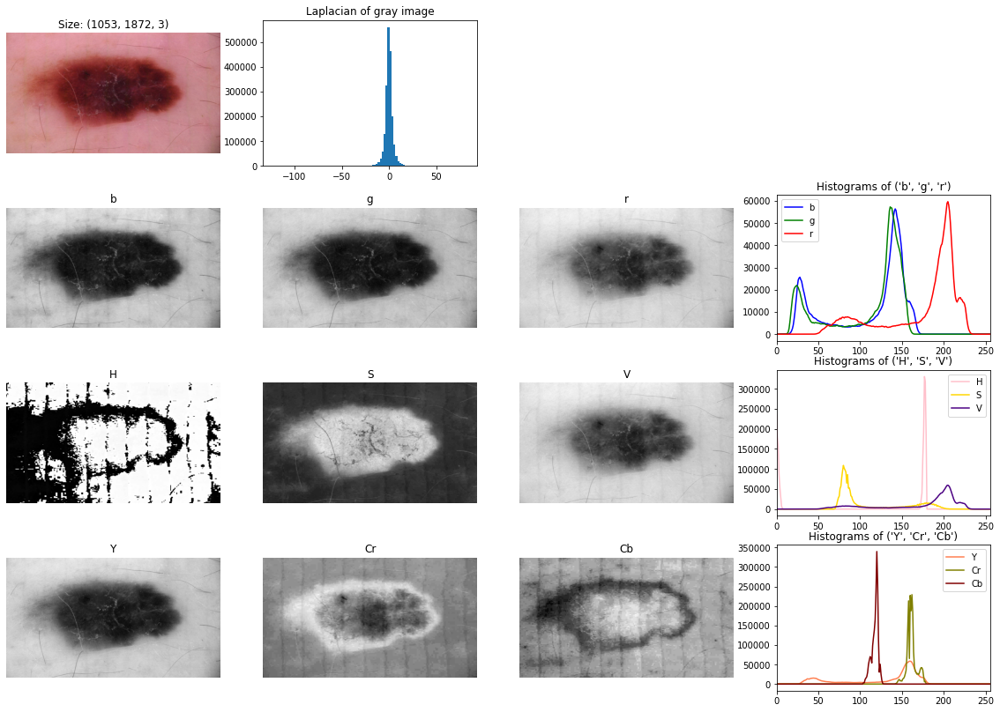

Brightness in RGB space: {5: 26.0, 25: 99.0, 50: 140.0, 75: 164.0, 95: 210.0}
Brightness in HSV space: {5: 1.0, 25: 81.0, 50: 171.0, 75: 183.0, 95: 210.0}
Brightness in YCrCb space: {5: 54.0, 25: 118.0, 50: 151.0, 75: 161.0, 95: 172.0}
Bluriness index: 
r: 17.89  g: 17.17  b: 18.32  H: 3280.53  S: 23.18  V: 17.89  Y: 16.46  Cr: 0.63  Cb: 0.56  Gray: 16.46  


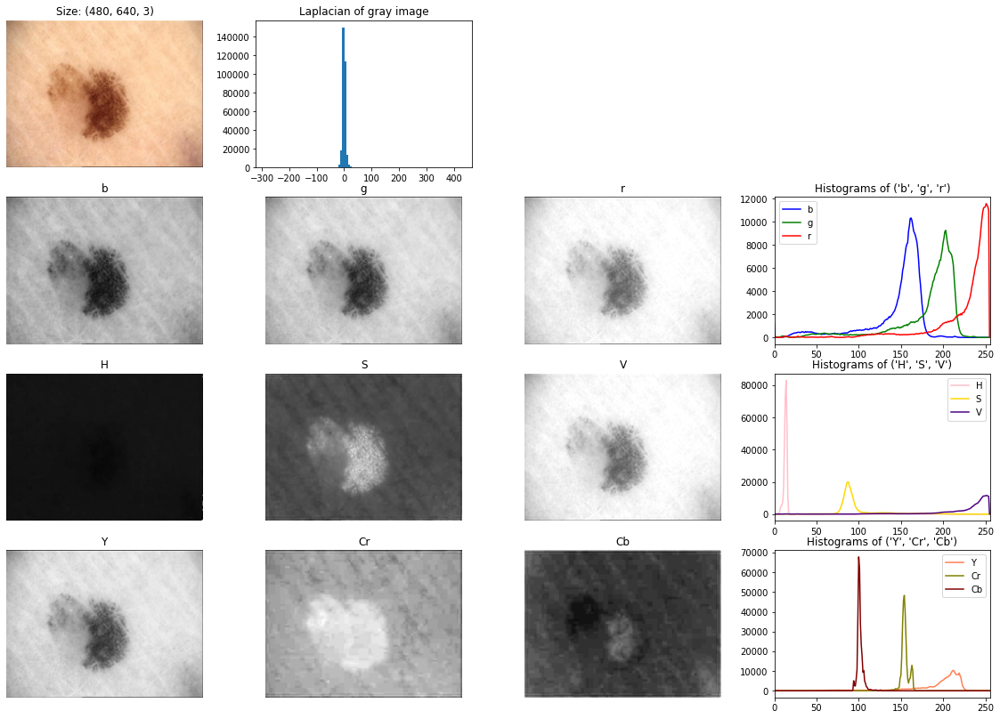

Brightness in RGB space: {5: 86.0, 25: 158.0, 50: 190.0, 75: 224.0, 95: 252.0}
Brightness in HSV space: {5: 12.0, 25: 14.0, 50: 89.0, 75: 224.0, 95: 252.0}
Brightness in YCrCb space: {5: 99.0, 25: 102.0, 50: 153.0, 75: 186.0, 95: 217.0}
Bluriness index: 
r: 666.32  g: 671.38  b: 658.02  H: 28.43  S: 468.29  V: 666.33  Y: 666.80  Cr: 1.20  Cb: 1.15  Gray: 666.82  


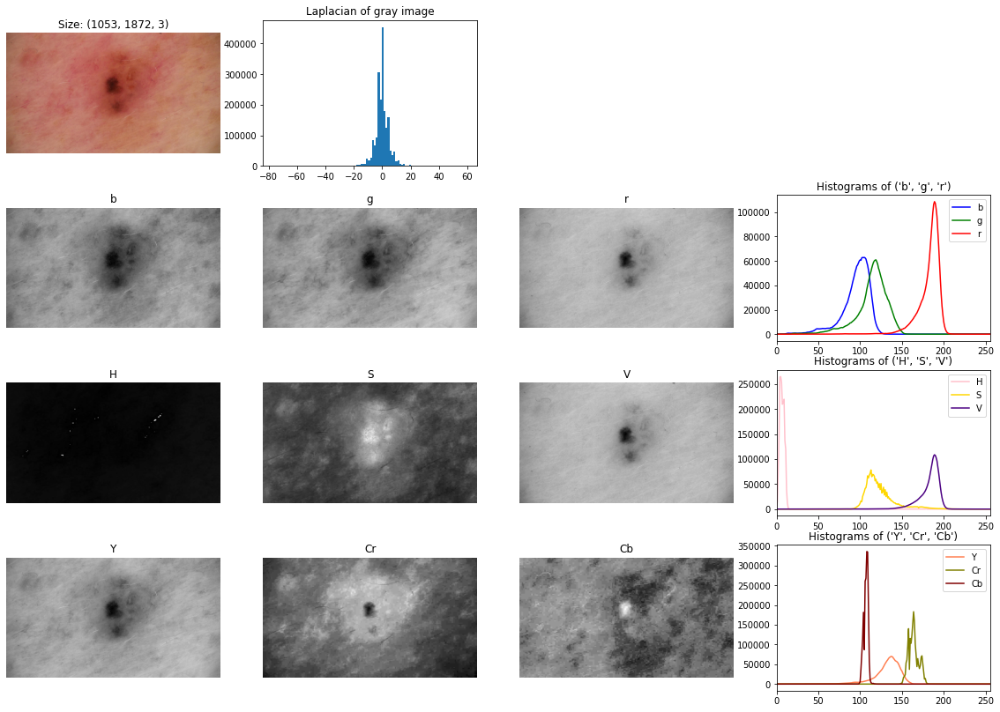

Brightness in RGB space: {5: 74.0, 25: 101.0, 50: 117.0, 75: 178.0, 95: 193.0}
Brightness in HSV space: {5: 4.0, 25: 9.0, 50: 118.0, 75: 179.0, 95: 193.0}
Brightness in YCrCb space: {5: 103.0, 25: 108.0, 50: 135.0, 75: 160.0, 95: 172.0}
Bluriness index: 
r: 24.16  g: 23.59  b: 24.50  H: 36.09  S: 16.25  V: 24.16  Y: 22.95  Cr: 0.55  Cb: 0.47  Gray: 22.95  


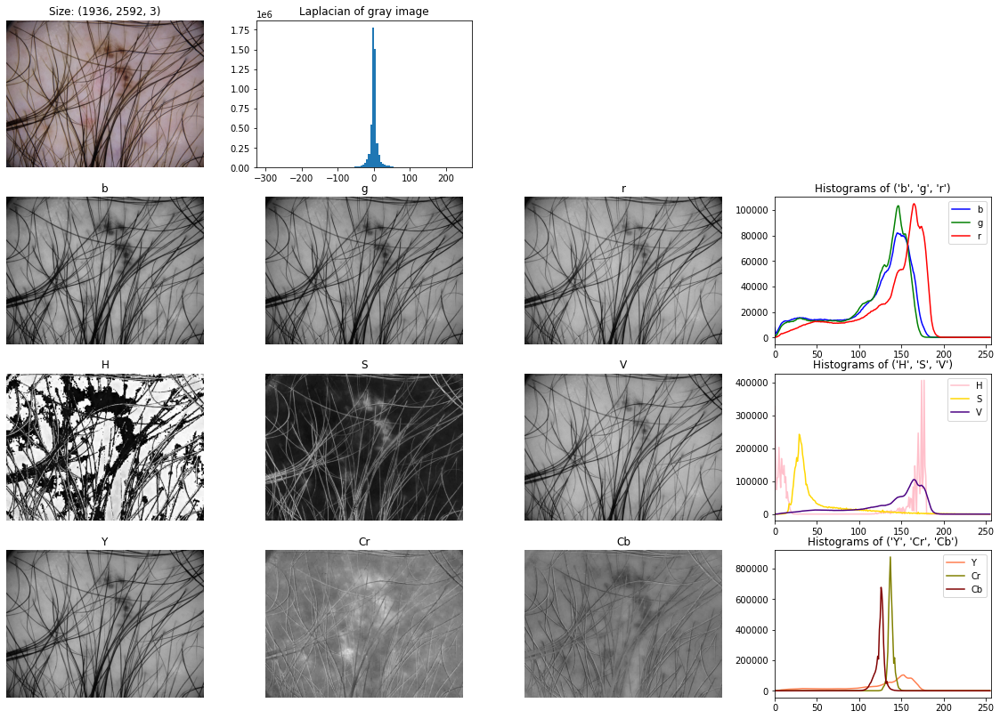

Brightness in RGB space: {5: 29.0, 25: 103.0, 50: 139.0, 75: 156.0, 95: 174.0}
Brightness in HSV space: {5: 4.0, 25: 29.0, 50: 97.0, 75: 166.0, 95: 178.0}
Brightness in YCrCb space: {5: 69.0, 25: 125.0, 50: 134.0, 75: 139.0, 95: 160.0}
Bluriness index: 
r: 178.83  g: 177.29  b: 181.36  H: 6968.43  S: 446.74  V: 179.23  Y: 176.18  Cr: 0.99  Cb: 1.69  Gray: 176.18  


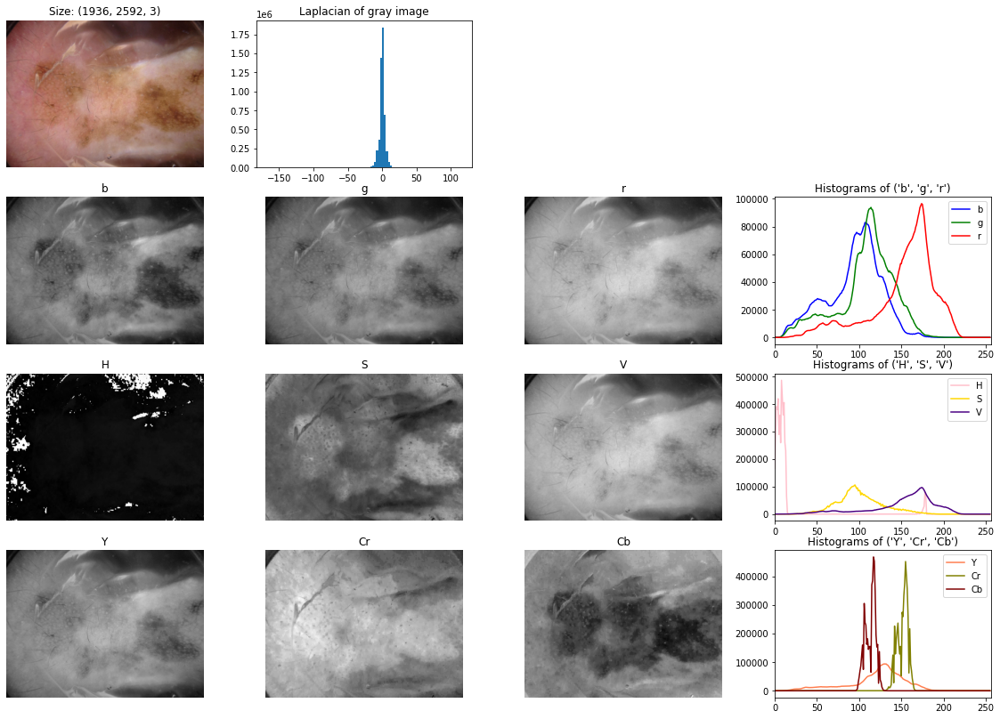

Brightness in RGB space: {5: 42.0, 25: 93.0, 50: 117.0, 75: 150.0, 95: 186.0}
Brightness in HSV space: {5: 2.0, 25: 10.0, 50: 95.0, 75: 151.0, 95: 185.0}
Brightness in YCrCb space: {5: 82.0, 25: 113.0, 50: 127.0, 75: 151.0, 95: 160.0}
Bluriness index: 
r: 17.64  g: 17.29  b: 18.16  H: 741.25  S: 26.73  V: 17.64  Y: 16.87  Cr: 0.36  Cb: 0.40  Gray: 16.87  


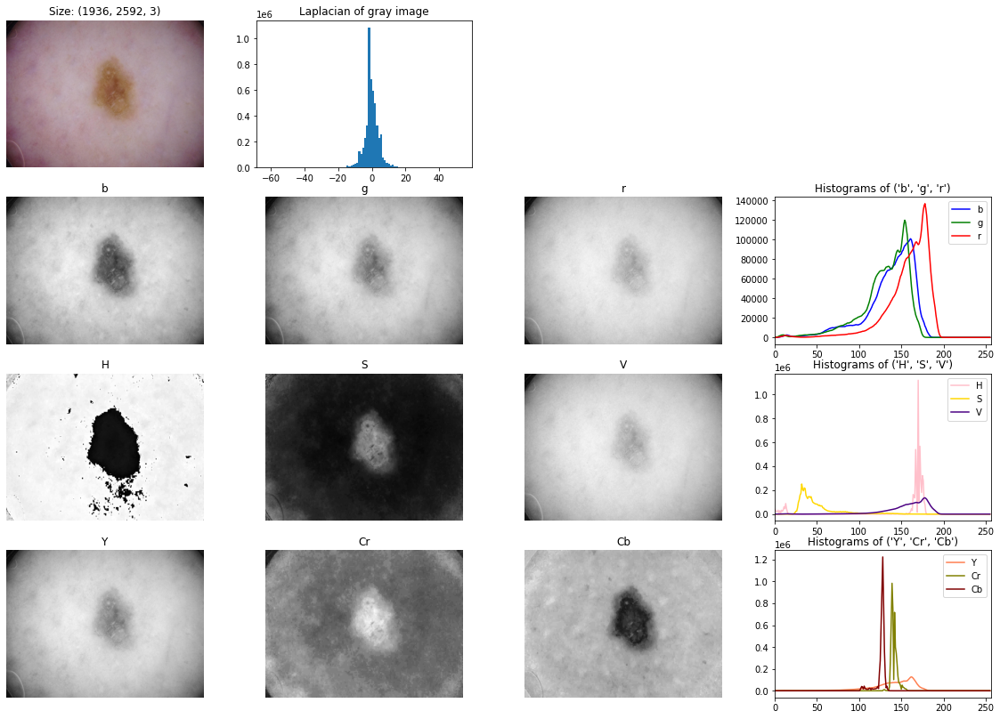

Brightness in RGB space: {5: 81.0, 25: 128.0, 50: 148.0, 75: 162.0, 95: 180.0}
Brightness in HSV space: {5: 28.0, 25: 48.0, 50: 158.0, 75: 171.0, 95: 180.0}
Brightness in YCrCb space: {5: 108.0, 25: 128.0, 50: 138.0, 75: 144.0, 95: 164.0}
Bluriness index: 
r: 17.76  g: 17.48  b: 18.12  H: 474.09  S: 17.29  V: 17.76  Y: 17.19  Cr: 0.27  Cb: 0.28  Gray: 17.19  


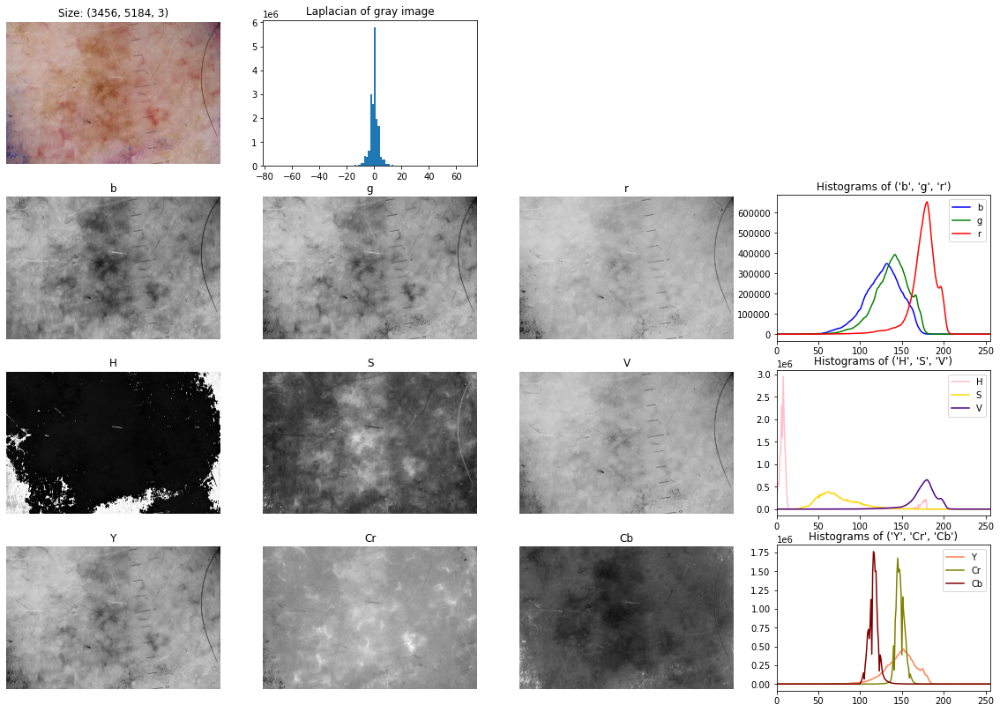

Brightness in RGB space: {5: 99.0, 25: 127.0, 50: 146.0, 75: 171.0, 95: 190.0}
Brightness in HSV space: {5: 4.0, 25: 10.0, 50: 74.0, 75: 172.0, 95: 190.0}
Brightness in YCrCb space: {5: 109.0, 25: 118.0, 50: 143.0, 75: 151.0, 95: 167.0}
Bluriness index: 
r: 11.97  g: 11.50  b: 12.62  H: 801.45  S: 8.57  V: 11.99  Y: 10.96  Cr: 0.45  Cb: 0.50  Gray: 10.96  


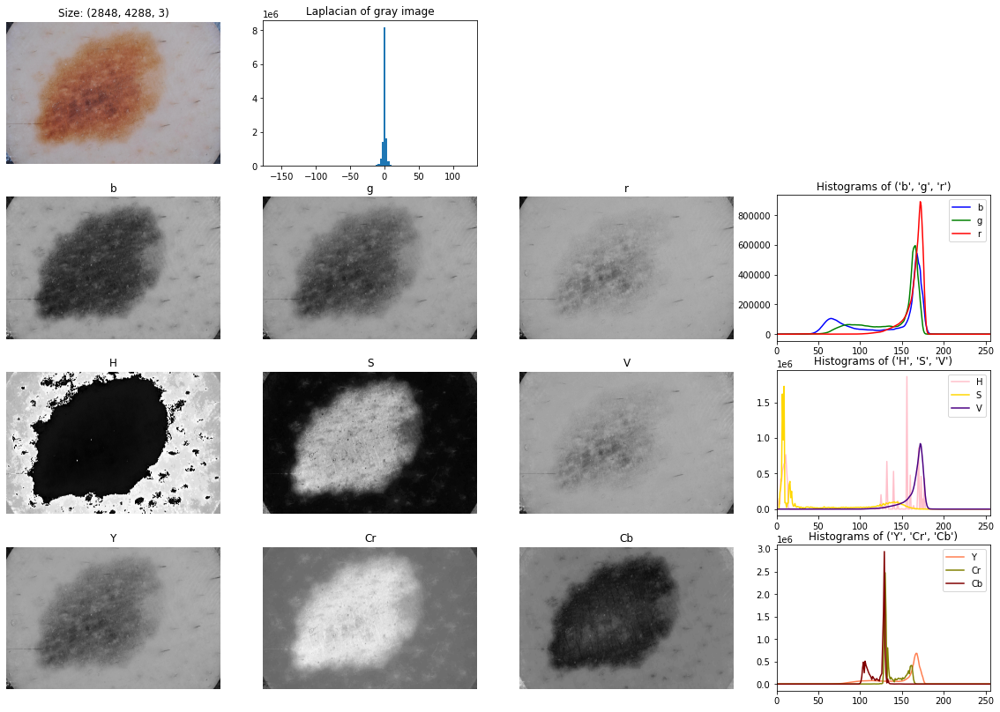

Brightness in RGB space: {5: 68.0, 25: 138.0, 50: 164.0, 75: 170.0, 95: 175.0}
Brightness in HSV space: {5: 6.0, 25: 10.0, 50: 139.0, 75: 168.0, 95: 175.0}
Brightness in YCrCb space: {5: 103.0, 25: 127.0, 50: 130.0, 75: 158.0, 95: 170.0}
Bluriness index: 
r: 8.61  g: 8.17  b: 9.04  H: 726.28  S: 9.84  V: 8.64  Y: 7.69  Cr: 0.44  Cb: 0.38  Gray: 7.69  


In [50]:
show_image_analytics(random9_mal, 'Malignant')